### PHY880 Lasers & Optomechanics - Final Project

### <span style="color:rgb(255, 0, 200)"> Development of an </a>  
# <span style="color:rgb(255, 0, 200)"> **Electrostatic Violin Mode Damper**  
### <span style="color:rgb(255, 0, 200)"> for suspended optics in gravitational wave detectors </a> 


## <span style="color:rgb(253, 120, 255)"> **Background & Motivation** 

### <span style="color:rgb(253, 120, 255)"> aLIGO Suspensions

The aLIGO detector is a FPMI where gravitational wave signals are readout at the anti-symmetric port due to differential length changes in the Fabry-Perot arms. However, these induced length changes are only on the order of $10^{-19}$ m, thus accurate readout requires the input and output couplers of the arm cavities to be isolated from every other possible source of movement (i.e. seismic and anthropogenic activity). To do this, the most important optics in the interferometer are suspended via pendulums, with most having multiple stages. The ITMs and ETMs specifically are suspended as a four stage pendulum where the last two masses are part of a ‘monolithic’ stage made of ultra low-loss fused silica.  

<img src="https://www.ligo.caltech.edu/system/media_files/binaries/217/original/Picture3.jpg?1432840822" width="500">
[1]



However, as with all pendulums, these suspensions have resonant frequencies at which perturbations can couple into mechanical movement, introducing noise. The test mass suspensions have 6 degrees of freedom with which that can move with respect to the the penultmate mass (PUM), in additional to another resonant mode that comes from the suspending fibers themselves called **violin modes**.

| Resonant Modes of the Monolithic Stage | Violin Modes in DARM |
| :---: | :---: |
| ![Screenshot 2026-04-12 at 6.17.42 PM.png](<attachment:Screenshot 2026-04-12 at 6.17.42 PM.png>) | ![Screenshot 2026-04-12 at 6.18.24 PM.png](<attachment:Screenshot 2026-04-12 at 6.18.24 PM.png>) |


[2][3]
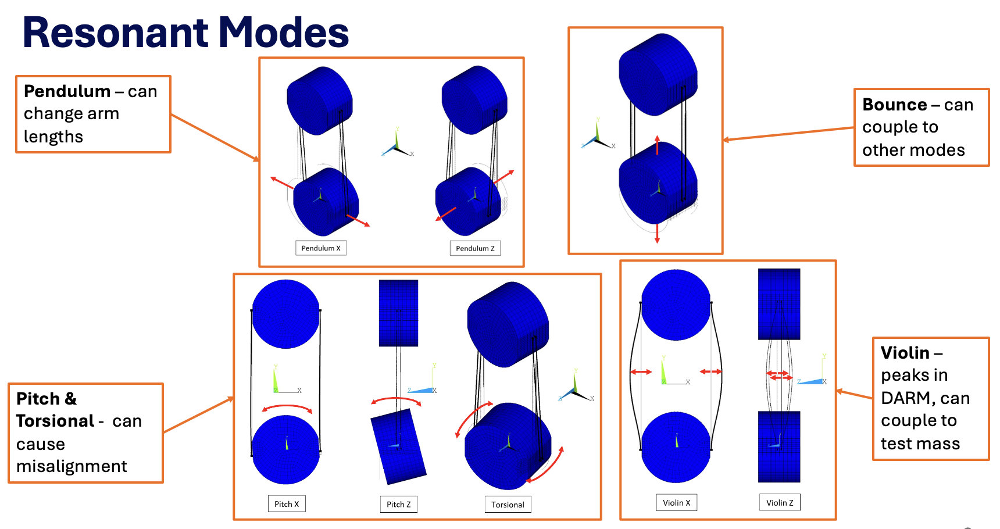
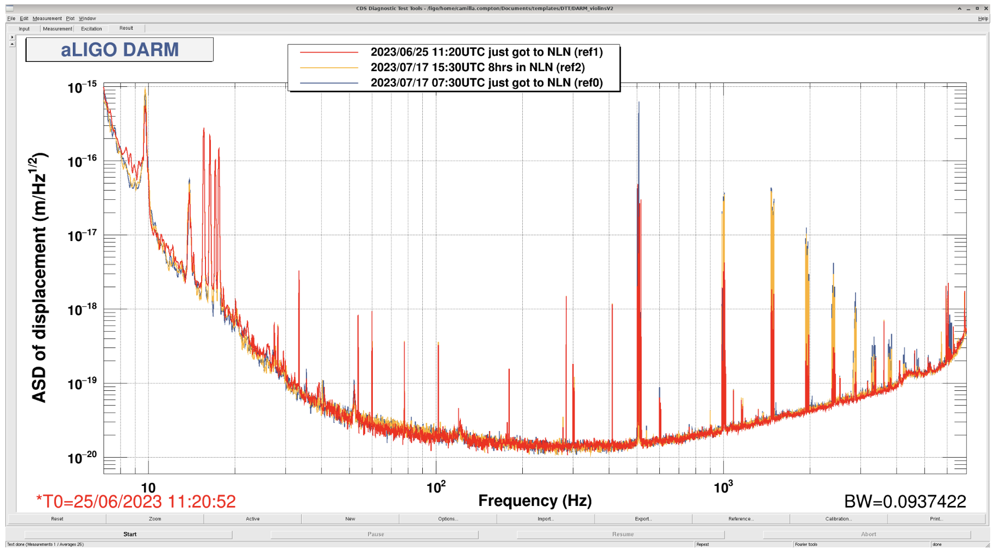

As shown above, >7 harmonics of these modes perpetually exist in the middle of our detection band and limit sensitivity at those frequencies. More importantly, they introduce operational issues when rung up. LIGO currently has ways to damp these modes by pushing on the PUM with electromagnetic actuators, but these methods come with limitations. We are currently only capable of damping when the full interferometer is locked, which can take anywhere from minutes to days depending on ambient conditions and day-to-day circumstances. Additionally, it's very difficult to discern which peak corresponds to which fiber, and on top of this, to our knowledge each fiber has two different fundamental modes at slightly different frequencies due to asymmetry in the overall system. Some violin mode frquencies can be as close as a few mHz, making damping via the PUM rather tricky. 

These resonant modes arise from the same mechanism as violin string vibrations or any other tensioned string-like structure:



$$
f_{\text{nth violin}}=\frac{n}{2L}\sqrt{\frac{T}{\mu}} \approx 500 \text{Hz for aLIGO fibers}
$$

You might be wondering, why don't we just tweak the tension and/or length of the fibers push the violin modes out of our detection band? The answer is non-trivial.

 Because we are measuring changes in length on such an extreme scale, thermal displacement noise is a dominating factor in the material and design considerations of these suspensions - fused silica is the chosen optics material for this very reason. Thermal displacement noise of a mechanical oscillator is given via the **fluctuation dissipation theorem** as 

$$
x^2(\omega)=\frac{4k_B T}{m\omega}\bigg(\frac{\omega_0^2 \phi(\omega)}{\omega_0^4 \phi^2(\omega)+(\omega_0^2-\omega^2)^2}\bigg) [4]
$$

where $\phi(\omega)$ is the mechanical loss angle at the frequency of interest, and $\omega_0$ is the resonant frequency. Due to the geometry of these fused silica fibers, the dominating factor in the loss angle $\phi$ is thermoelastic, which is given by

$$
\phi_{\text{thermo}}(\omega)=\frac{YT}{\rho C}\bigg( \alpha - \sigma_0 \frac{\beta}{Y}\bigg)^2 \bigg(\frac{\omega \tau}{1+(\omega \tau)^2}\bigg) [5]
$$

where $\alpha$ is the linear thermal expansion coefficient, $\sigma_0$ is the loaded static stress, and $\beta$ is the thermal elastic coefficient. These dependencies are used to our advantage in the fibers' design. By tapering the 'neck' of the fibers and carefully controlling their geometry around the most lossy regions, we can balance $\alpha$ and $\sigma_0 \frac{\beta}{Y}$ such that $\alpha - \sigma_0 \frac{\beta}{Y}=0$ to minimize $\phi_{\text{thermo}}$.

<img src="https://www.ligo.caltech.edu/system/media_files/binaries/198/original/Fiber_closeup.jpg?1431972552" width="500"> [1]

 

## <span style="color:rgb(253, 120, 255)"> **The Solution: an EVMD**

Essentially every aspect of these fibers is already min-maxed for optimal noise performance. But if we can't change the fibers, what **can** we do about the violin modes?

Our proposed solution: an integrated _violin mode sensor and electrostatic damper_. For such a device, we would require two things: **adequate sensitivity** to the fibers' dispacement, and an **actuator** that can exert enough force to damp this displacement. 

### <span style="color:rgb(253, 120, 255)"> Sensitivity Requirement & Method

In our differential arm signal (DARM), the violin modes can reach up to $10^{-15} \frac{m}{\sqrt{Hz}}$, _but_ this doesn't exactly translate 1:1 to fiber motion; this $10^{-15}$ is telling us how much the test mass is moving due to the violin mode, so we can work backwards to figure out the motion of the fiber itself:

$$
\text{fiber motion}\approx \frac{\text{test mass}}{\text{fiber mass}}\times \text{test mass motion from DARM} = \frac{40 kg}{1.6\times10^{-4}kg}\times10^{-15} \frac{m}{\sqrt{Hz}}
$$
$$
\approx \mathbf{10^{-9} \frac{m}{\sqrt{Hz}} \text{   required sensitivity}}
$$

To readout the violin modes, we've designed a simple shadow sensor consisting of an LED and split photodiode. We align the components such that the LED casts the fiber's shadow driectly onto the gap between the photodiode segments. Then, as the fiber vibrates, we can look at the differece between the photodiode segment outputs to readout the violin mode frequency. In practice, it looks a bit like this:

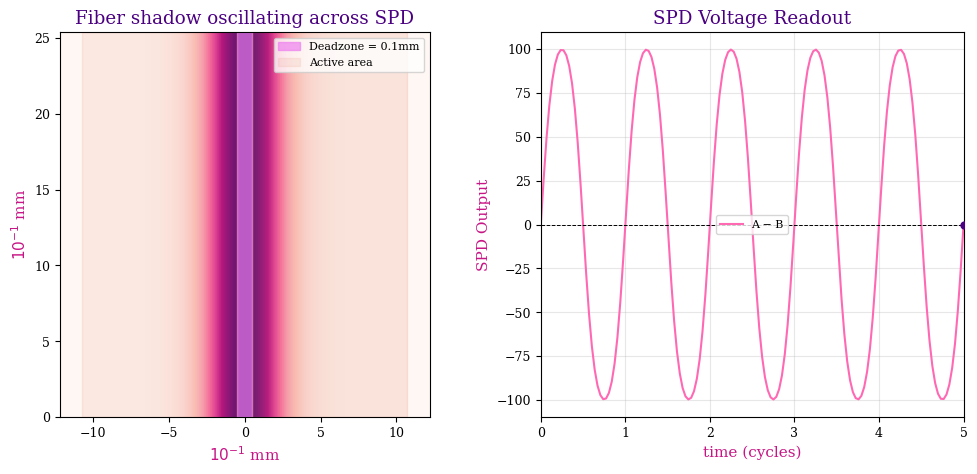

In [46]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation

#--------------------------------- Split Photodiode Setup -------------------------------------#
"""   
These numbers just come from modeling the 'split photodiode' to match the dimensions of my actual component.
Length of each segment = 1.22mm, height = 2.45 mm
"""

L = 24.4/2
H = 25.4
Nx, Ny = 200, 100
x = np.linspace(-L, L, Nx)
y = np.linspace(0, H, Ny)
X, Y = np.meshgrid(x, y)

I0 = 1           # shadow 'depth', essentially just how dark the center of the shadow is
sigma = 2.0      # shadow width in 0.1 mm units
deadzone = 1.0   # size of split between segments, also set to match my real component

def lin_gaussian(x0):
    return I0 * np.exp(-((X - x0)**2) / (2 * sigma**2))

"""  
I don't think it's 100% accurate to model the shadow as a perfect Gaussian, but it's close enough for my purposes. 
In reality there's some amount of light that transmits through the fiber and likely makes the shadow slightly more of a flat-top shape. 
"""

# 10 cycles, 60 frames per cycle
n_cycles = 5
frames_per_cycle = 30
n_frames = n_cycles * frames_per_cycle
t = np.linspace(0, n_cycles * 2 * np.pi, n_frames)
osc_amplitude = 2.50
x_positions = osc_amplitude * np.sin(t)

#--------------------------------- Solving for Difference vals -------------------------------------#
"""   
Important note here: this is essentially integrating the shadow itself, NOT the uncovered portions of the segments around the shadow.
In my real experiment, the portions of the segments uncovered by the shadow are what create the photocurrent and thus my signal. 
This is a little easier to model and the only difference this makes is the sign of my signal is flipped. 
"""
dx = x[1] - x[0]; dy = y[1] - y[0]; dA = dx * dy

diff_vals = []
sum_vals  = []

for position in x_positions:
    G = lin_gaussian(position)
    left  = np.sum(G[X < -deadzone/2]) * dA
    right = np.sum(G[X >  deadzone/2]) * dA
    diff_vals.append(right - left)
    sum_vals.append(right + left)

diff_vals = np.array(diff_vals)
sum_vals  = np.array(sum_vals)
time_s = np.linspace(0, n_cycles, n_frames)   # n_cycles seconds total

#--------------------------------- Plots -------------------------------------#
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

# Left: heatmap
im = ax1.imshow(lin_gaussian(x_positions[0]), extent=[-L, L, 0, H],
                origin="lower", cmap="RdPu", vmin=0, vmax=1)
ax1.axvspan(-.5, .5, color='violet', alpha=0.7, label='Deadzone = 0.1mm')
ax1.axvspan(-10.72, -.5, color='darksalmon', alpha=0.15, label='Active area')
ax1.axvspan(.5, 10.72, color='darksalmon', alpha=0.2)
ax1.set_title("Fiber shadow oscillating across SPD", color='indigo')
ax1.set_xlabel("$10^{-1}$ mm", color='mediumvioletred')
ax1.set_ylabel("$10^{-1}$ mm", color='mediumvioletred')
ax1.legend(fontsize=8)

# Right: time series
(difline,) = ax2.plot([], [], 'hotpink', lw=1.5, label="A − B")
#(sumline,) = ax2.plot([], [], 'darkviolet', lw=1.5, label="A + B")
dot, = ax2.plot([], [], 'o', color='indigo', ms=5, zorder=5)
ax2.axhline(0, color="k", linestyle="--", lw=0.7)
ax2.set_xlim(0, n_cycles)
ax2.set_ylim(diff_vals.min() - 10, diff_vals.max() + 10)
ax2.set_xlabel("time (cycles)", color='mediumvioletred')
ax2.set_ylabel("SPD Output", color='mediumvioletred')
ax2.set_title("SPD Voltage Readout", color='indigo')
ax2.legend(fontsize=8)
ax2.grid(True, alpha=0.3)

#--------------------------------- Animation -------------------------------------#
def update(frame):
    im.set_data(lin_gaussian(x_positions[frame]))
    difline.set_data(time_s[:frame+1], diff_vals[:frame+1])
    #sumline.set_data(time_s[:frame+1], sum_vals[:frame+1])
    dot.set_data([time_s[frame]], [diff_vals[frame]])
    return im, difline, dot  #im, difline, sumline, dot

ani = FuncAnimation(fig, update, frames=n_frames, interval=30, blit=True)
from IPython.display import HTML
HTML(ani.to_jshtml())


### <span style="color:rgb(253, 120, 255)"> Force Requirement & Actuation Mechanism

The total energy of an oscillator is given by 

$$E=\frac{1}{2}kA^2$$ 

where A is the amplitude and $k=\omega^2m=2\pi m f_{VM}$. If we aim to damp a 500Hz mode in roughly 60 seconds, then $Q_d=60s\times 500Hz = 30000$ and we can approximate the energy we need to extract per oscillation as 

$$
E_{\text{Damp}} = \frac{E_\text{stored}}{Q} = \bigg(\frac{1}{2}\bigg)\frac{1.6\times10^{-4}\times(2\pi \times 500Hz\times 10^{-9}m)^2}{30000} \approx 10^{-18}J
$$

Finally, the force we need to damp our fiber motion with this amount of energy is simply

$$
F=\frac{W}{D} = \frac{10^{-18}J}{10^{-9}m} \approx \mathbf{10^{-10}N}
$$

To produce this force, we're using an **electrostatic actuator** with periodic electrodes, alternating between a an AC signal voltage and a DC bias voltage. Electrostatic actuators are already used in LIGO to actuate on the test mass itself [6]. Generally, this force is given by 

$$
F_{\text{electrostatic}}\propto \alpha (\Delta V)^2
$$

where $\Delta V = V_B-V_S$. In the case of a linear comb actuator, we can construct the electric potential as Fourier series. 



| Potential of our electrodes | The physical setup of the actuator |
| :---: | :---: |
| ![Screenshot 2026-04-12 at 7.06.54 PM.png](<attachment:Screenshot 2026-04-12 at 7.06.54 PM.png>) | ![Screenshot 2026-04-12 at 7.07.01 PM.png](<attachment:Screenshot 2026-04-12 at 7.07.01 PM.png>) |

From the setup above, we see the potential is essentially a stepwise function that can be written as:

$$
V(x, z=0) = \begin{cases}
    \frac{V}{2}  & \frac{d}{2} \leq x \leq \frac{L-d}{2} \\
    -\frac{V}{2} & -\frac{L-d}{2} \leq x \leq -\frac{d}{2} \\
    0            & \text{elsewhere (gaps between electrodes)}
\end{cases}
$$

Since this is odd, we construct a fourier series with just sine terms:

$$
V(x)= \sum_{n=0}^{\infty}V_n\sin{\frac{2\pi nx}{L}}   
$$

where the coefficients are given by

$$
V_n(z=0) = \frac{2}{L}\int_{-\frac{L}{2}}^{\frac{L}{2}}V\sin\frac{2\pi nx}{L}dx \rightarrow \frac{2V}{\pi n}\cos{\bigg(\frac{d\pi n}{L}}\bigg)
$$

Thus the potential at the electrode plane is  

$$
V(x,z=0)= \sum\frac{2V}{\pi n}\cos{\bigg(\frac{d\pi n}{L}}\bigg)\sin{\frac{2\pi nx}{L}}
$$
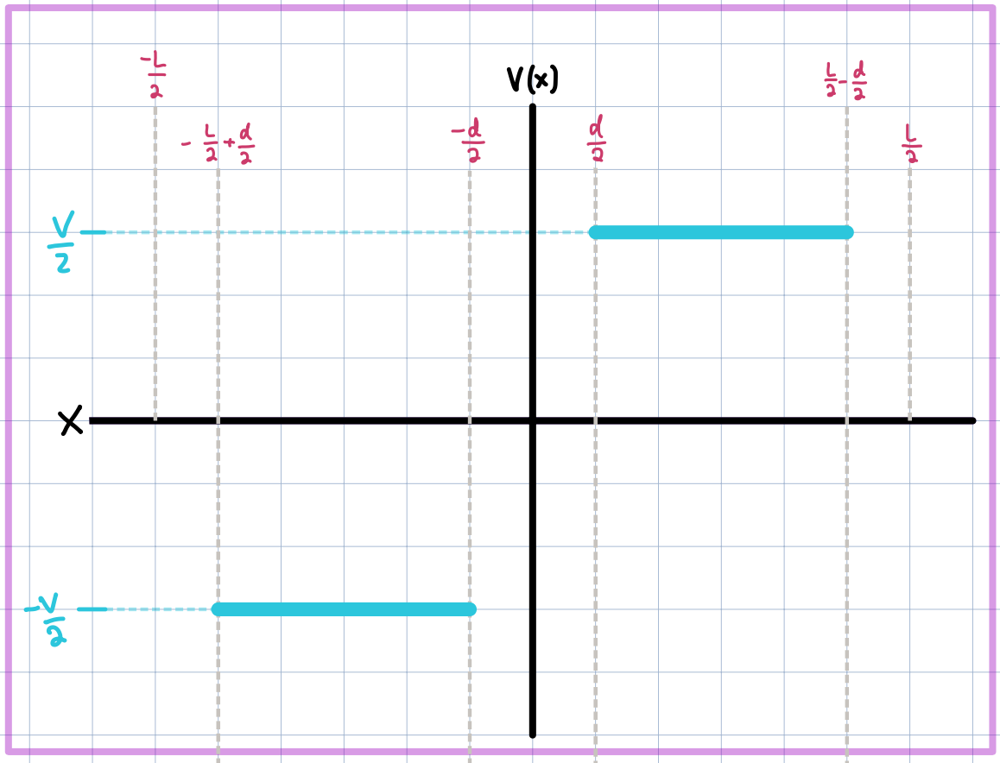
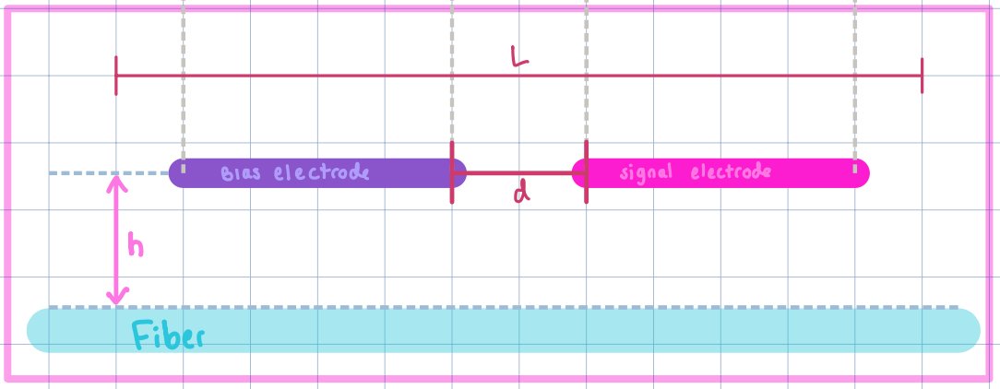

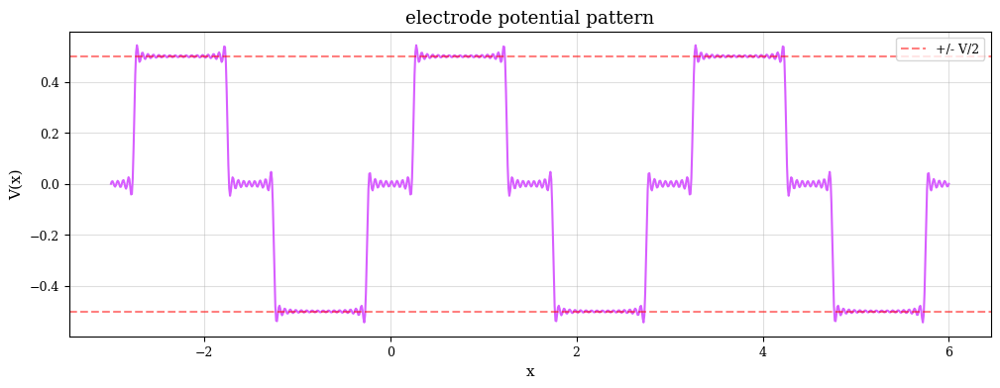

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

"""   
The numbers below are just dummy parameters to give you the visual
"""
V = 1.0
d = 0.5   # gap between bias and signal electrodes, want this to be very small compared to L
L = 3
k = 50    # number of terms

x = np.linspace(-L, 2*L, 1000)

potential = np.zeros_like(x)
for n in range(1, k+1, 2):  # odd n only, even modes completely cancel eachother and dont contribute
    kn = 2 * np.pi * n / L
    Vn = (2*V / (np.pi * n)) * np.cos(np.pi * n * d / L)
    potential += Vn * np.sin(kn * x)

plt.figure(figsize=(12, 4))
plt.plot(x, potential, color="#d75eff")
plt.axhline(V/2, color='r', linestyle='--', alpha=0.5, label='+/- V/2')
plt.axhline(-V/2, color='r', linestyle='--', alpha=0.5)
plt.xlabel('x')
plt.ylabel('V(x)')
plt.title('electrode potential pattern')
plt.legend()
plt.grid(True)
plt.show()

Applying a Fourier transform to our V(x,z=0)



, then using $E=-\nabla V(x,z)$ and Laplace's equation gives us 

$$
E_{n\perp}(h^+) = \frac{kV_n(z=0)}{\cosh(kh)+\epsilon_e\sinh(kh)} \text{  and  } E_{n\perp}(h^-) = \frac{\epsilon_2kV_n(z=0)}{\cosh(kh)+\epsilon_e\sinh(kh)}
$$

Approximating the fiber as a sheet of charge-area density $\sigma$ at z=h due to the field, we can find nth force per area component:

$$
f_n = \sigma E_{\perp} \propto E_{n\perp}^2(h^+)-E_{n\perp}^2(h^-)
$$

After appropriate substitutions and simplification, the total **force per unit area** of the actuator is 

$$
F=\sum f_n = \frac{4\epsilon_0(1-\epsilon^2_2)V^2}{L^2}\sum_{n=1,odd}^{\infty} \bigg( \frac{\cos(\frac{\pi n d}{L})}{ \cosh(\frac{2\pi nh}{L})+\epsilon_2\sinh(\frac{2\pi nh}{L}  )} \bigg)^2  [7]
$$

where V is actually $\Delta V = V_B-V_S$.


The most important relationship here is $F \propto (V_B - V_S)^2$. To damp the violin mode we use a large DC votlage as the bias, and an AC signal at the violin mode frequency + 180˚

So, our general force proportionality is 

$$
F \propto (V_B - V_S)^2 = (V_{DC}-V_{AC}\sin(\omega_{VM}t))^2 
$$

$$
\rightarrow F \propto V^2_{DC}+ \frac{V^2_{AC}}{2}- \mathbf{2V_{DC} V_{AC}\sin(\omega_{VM}t)}-\frac{V^2_{AC}}{2}\cos(2\omega_{VM}t)
$$

where the most important term is the AC force at the VM frequency, $\propto \mathbf{V_{DC}V_{AC}}$



Additionally, we see that the full force expression depends on a few parameters we can control with the design:

1. h, the distance between the fiber and actuator
2. d, the separation between the electrodes
3. L, the periodicity of the electrodes

Due to spatial constraints, I'm restricted with a fiber-to-actuator distance of 3mm. However, I can play around with d and L to optimize my actuator design. To help with the design process, I made a heat map for force optimization as a function of both d and L:

/var/folders/fh/3pbmkshx1f76q4pncv9lrxrr0000gn/T/ipykernel_59313/3761433583.py:40: RuntimeWarning: overflow encountered in cosh
  denom = np.cosh(h_tilde*n) + eps2*np.sinh(h_tilde*n)
/var/folders/fh/3pbmkshx1f76q4pncv9lrxrr0000gn/T/ipykernel_59313/3761433583.py:40: RuntimeWarning: overflow encountered in sinh
  denom = np.cosh(h_tilde*n) + eps2*np.sinh(h_tilde*n)
/var/folders/fh/3pbmkshx1f76q4pncv9lrxrr0000gn/T/ipykernel_59313/3761433583.py:42: RuntimeWarning: overflow encountered in cosh
  denom_s = np.cosh(h_tilde_s*n) + eps2*np.sinh(h_tilde_s*n)
/var/folders/fh/3pbmkshx1f76q4pncv9lrxrr0000gn/T/ipykernel_59313/3761433583.py:42: RuntimeWarning: overflow encountered in sinh
  denom_s = np.cosh(h_tilde_s*n) + eps2*np.sinh(h_tilde_s*n)


Optimal periodicity length (m): 0.017638655462184873
Optimal d (m): 1.7638655462184874e-06


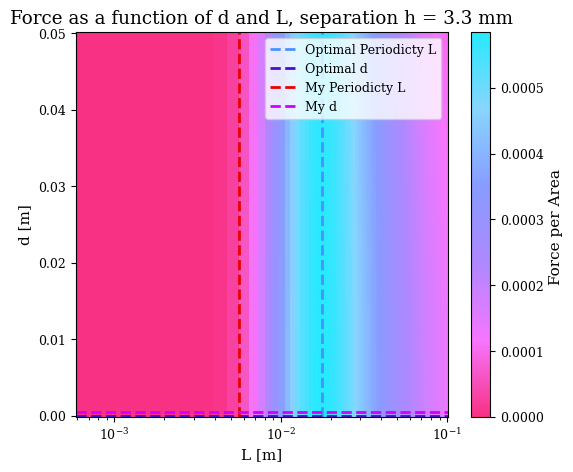

Force/Area at L=5.99mm and d=0.939mm is 6.217e-05 N/m^2; Total force for 3cm actuator =  7.460670069723046e-10 N


In [89]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

eps0 = 8.854e-12            # vacuum permitivity 
eps2 = 3.87e-11             # absolute permitivity of fused silica 
h = 0.0033                  # 3.3 mm distance to fiber
v_1 = 40                    # Maximum electrode potential 1, signal pktopk
v_2 = 400                   # Maximum electrode potential 2, bias DC
fiber_diam = 0.0004         # 400 µm fiber diameter, aLIGO spec.
act_length = 0.03           # 3cm 

d_stefan = 0.0000001        # d=0
L_stefan= 0.05              # 5cm
p_stefan= 2*np.pi*h         # Optimal periodicity 

v = (v_1*v_2)

"""
d is size of gap between adjacent electrodes
L is the full periodicity, gives the length of two electrodes + 2d
"""

# Ranges of L and d in meters
L_vals = np.linspace(0.001, 0.1, 120)      # 1 mm to 10 cm    
d_vals = np.linspace(0.0001, 0.05, 120)   # 0.5 mm to 5 mm
L_grid, ratio_grid = np.meshgrid(L_vals, d_vals)
d_grid = ratio_grid * L_grid

# Fourier modes
Nmax = 1000
n = np.arange(1, Nmax, 2)[:, None, None]

h_tilde = 2*np.pi*h / L_grid
d_tilde = 2*np.pi*d_grid / L_grid
h_tilde_s = 2*np.pi*h / p_stefan
d_tilde_s = 2*np.pi*d_stefan/ p_stefan

num = np.cos((d_tilde*n/2))
denom = np.cosh(h_tilde*n) + eps2*np.sinh(h_tilde*n)
num_s = np.cos((d_tilde_s*n/2))
denom_s = np.cosh(h_tilde_s*n) + eps2*np.sinh(h_tilde_s*n)

series = np.sum((num/denom)**2, axis=0)
series_s = np.sum((num_s/denom_s)**2, axis=0)
F = (eps0*(1-eps2**2)*v/(np.pi**2*h**2)) * (h_tilde**2) * series 
F_s = (eps0*(1-eps2**2)*v/(np.pi**2*h**2)) * (h_tilde_s**2) * series_s 

# Finding values of d and L that give maximum force
idx = np.unravel_index(np.argmax(F), F.shape)
L_opt = L_grid[idx]
d_opt = d_grid[idx]

print("Optimal periodicity length (m):", L_opt)
print("Optimal d (m):", d_opt)

colors = ["#F83184", "#F676FF", "#AE88FF",  "#889CFF", "#88D5FF", "#27E9FF"]
cmap = LinearSegmentedColormap.from_list("custom_map", colors)

plt.figure(figsize=(6,5))
plt.pcolormesh(L_vals, d_vals, F, shading='auto',cmap=cmap)
plt.xscale('log')
plt.xlabel("L [m]")
plt.ylabel("d [m]")
plt.colorbar(label="Force per Area ")
plt.axvline(L_opt, color="#4693FF", linewidth=2, linestyle="--", label="Optimal Periodicty L")
plt.axhline(d_opt, color="#4B0DD0", linewidth=2, linestyle="--", label="Optimal d")
plt.axvline(0.00564, color="#EC0000", linewidth=2, linestyle="--", label="My Periodicty L")    # from an actuator I've designed
plt.axhline(0.0005, color="#D000FF", linewidth=2, linestyle="--", label="My d")                # also from my actuator design
plt.title("Force as a function of d and L, separation h = 3.3 mm")
plt.legend()
plt.show()


### finding the force producedby my actuator ###

L_target = 0.00564
d_target = 0.001

i_L = np.argmin(np.abs(L_vals - L_target)) # Finding the closest index in the L_vals array
i_d = np.argmin(np.abs(d_vals - d_target)) # Finding the closest index in the d_vals array

# Extracting the F/V^2 value from the grid
F_over_V2_target = F[i_d, i_L]
force = F_over_V2_target * fiber_diam * act_length


print("Force/Area at L={:.2f}mm and d={:.3f}mm is {:.3e} N/m^2;".format(
    L_vals[i_L]*1e3, d_vals[i_d]*1e3, F_over_V2_target), "Total force for 3cm actuator = ", force, "N")

#print("Force at L = {:.2f} mm and d = {:.3f} mm, actuator length = 3cm is {:.3e}".format(
 #   L_vals[i_L]*1e3, d_vals[i_d]*1e3, force), "N")




## <span style="color:rgb(253, 120, 255)"> **Progress & Prototype Characterization**

### <span style="color:rgb(253, 120, 255)"> Displacement Sensitivty as of now

Using an LED and split photodiode, my sensor is capable of resolving ~$10^{-10}$ m of fiber motion, which is enough to see peaks in DARM at or above $10^{-16}\frac{m}{\sqrt{Hz}}$.

In [50]:
#### PACKAGE IMPORTS ####

import sys
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
from tqdm import tqdm
from scipy import optimize
from scipy import interpolate
from scipy import special
from scipy import integrate
import copy
#import lmfit

sys.path.insert(1, '/opt/anaconda3/lib/python3.12/site-packages')

import zero
import zero.analysis

In [51]:
#### SETUP & STYLE ####

f = np.logspace(-3, 5, 1000)

plt.rcParams.update({
    "text.usetex": False,
    "font.family": "serif",
    'font.size' : 11,     
    'axes.labelsize': 11, 
    "grid.alpha": 0.4,
    'xtick.labelsize': 9,
    'ytick.labelsize': 9,
    'legend.fontsize': 9,

    "figure.figsize": (5.5807085927770865, 3.4490675916448357)
})

In [52]:
#### HELPER FUNCTION ####

def get_noisy_comps(noise_sol, thresh):
    noises = [o.spectral_density for o in noise_sol.noise['__default__']]
    max_noise = np.max(noises, axis=1)
    avg_noise = np.mean(noises, axis=1)

    names = [o.source for o in noise_sol.noise['__default__']]

    noisy_comps = []
    for i in range(len(names)):
        if max_noise[i] >= thresh: noisy_comps.append([names[i], max_noise[i], avg_noise[i]])

    return np.array(noisy_comps)

def v2p(d, s, dia):
    return 1/(2*np.sqrt(2)) * dia * special.erfinv(d / s)

In [53]:
#### CONSTRUCT CIRCUIT ####

evmd = zero.Circuit()

#Photodiode 1
evmd.add_capacitor(name="pd1_c", value="50p", node1="pd11", node2="gnd")
evmd.add_resistor(name="pd1_sh", value="10M", node1="pd11", node2="gnd")
evmd.add_resistor(name="pd1_rsh", value="5", node1="pd11", node2="tia1_-")

#Photodiode 2
evmd.add_capacitor(name="pd2_c", value="50p", node1="pd21", node2="gnd")
evmd.add_resistor(name="pd2_sh", value="10M", node1="pd21", node2="gnd")
evmd.add_resistor(name="pd2_rsh", value="5", node1="pd21", node2="tia2_-")

#TIA 1
evmd.add_library_opamp(name='tia1', model="ADA4523-1", node1="gnd", node2="tia1_-", node3="tia1_out")
evmd.add_capacitor(name='tia1_cin', value='100p', node1="tia1_-", node2="gnd")

evmd.add_resistor(name='tia1_rf', value='5.1k', node1='tia1_-', node2='tia1_out')
evmd.add_capacitor(name='tia1_cf', value='1n', node1='tia1_-', node2='tia1_out')

#TIA 2
evmd.add_library_opamp(name='tia2', model="ADA4523-1", node1="gnd", node2="tia2_-", node3="tia2_out")
evmd.add_capacitor(name='tia2_cin', value='100p', node1="tia2_-", node2="gnd")

evmd.add_resistor(name='tia2_rf', value='5.1k', node1='tia2_-', node2='tia2_out')
evmd.add_capacitor(name='tia2_cf', value='1n', node1='tia2_-', node2='tia2_out')

#Summing
evmd.add_resistor(name='sum_rin1', value='5k', node1='tia1_out', node2='sum_-')
evmd.add_resistor(name='sum_rin2', value='5k', node1='tia2_out', node2='sum_-')

evmd.add_library_opamp(name='summer', model="ADA4523-1", node1="gnd", node2="sum_-", node3="sum_out")

evmd.add_resistor(name='sum_rf', value='5k', node1='sum_-', node2='sum_out')
evmd.add_capacitor(name='sum_cf', value='1n', node1='sum_-', node2='sum_out')

#Difference
evmd.add_resistor(name='diff_rin1', value='5k', node1='tia1_out', node2='diff_-')
evmd.add_resistor(name='diff_rin2', value='5k', node1='tia2_out', node2='diff_+')

evmd.add_library_opamp(name = 'diff', model="ADA4523-1", node1="diff_+", node2="diff_-", node3="diff_out")

evmd.add_resistor(name='diff_rf1', value='5k', node1='diff_-', node2='diff_out')
evmd.add_capacitor(name='diff_cf1', value='1n', node1='diff_-', node2='diff_out')
evmd.add_resistor(name='diff_rf2', value='5k', node1='diff_+', node2='gnd')
evmd.add_capacitor(name='diff_cf2', value='1n', node1='diff_+', node2='gnd')


<>:19: SyntaxWarning: invalid escape sequence '\O'
<>:19: SyntaxWarning: invalid escape sequence '\O'
/var/folders/fh/3pbmkshx1f76q4pncv9lrxrr0000gn/T/ipykernel_59313/3973468019.py:19: SyntaxWarning: invalid escape sequence '\O'
  plt.ylabel("Gain [$\Omega$]")


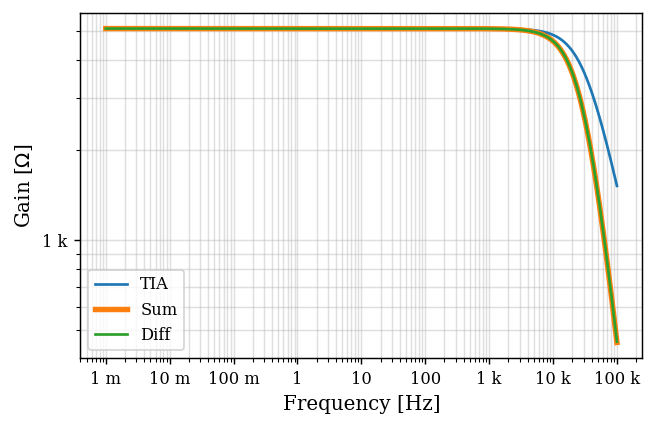

-3dB Bandwidth = 2e+04


In [54]:
#### CIRCUIT TFs ####

import zero
import zero.analysis

analysis = zero.analysis.AcSignalAnalysis(circuit=evmd)
solution = analysis.calculate(frequencies=f, input_type="current", node='pd11')
tia_tf = solution.get_response(sink='tia1_out')
sum_tf = solution.get_response(sink='sum_out')
diff_tf = solution.get_response(sink='diff_out')


fig, ax = plt.subplots(dpi=130)
plt.loglog(f, tia_tf.magnitude, label='TIA')
plt.loglog(f, sum_tf.magnitude, label='Sum', lw=3)
plt.loglog(f, diff_tf.magnitude, label='Diff')

plt.xlabel('Frequency [Hz]')
plt.ylabel("Gain [$\Omega$]")
plt.grid(which='both')
plt.legend()
#plt.ylim([1e3, 10e3])

ax.xaxis.set_major_formatter(ticker.EngFormatter())
ax.yaxis.set_major_formatter(ticker.EngFormatter())

#plt.savefig('./TF.pdf', transparent=True, bbox_inches='tight')
plt.show()

bw = f[np.argmin(np.abs(sum_tf.db_magnitude - (sum_tf.db_magnitude[0] - 3)))]
print(f'-3dB Bandwidth = {bw:.2}')

In [55]:
#### SET DC LEVELS TO CALC SHOT NOISE ####


# Input measured DC sum voltage
dc_sum = 6.62           # for one photodiode, so segment1 + segment 2  6.3    6.4most recent, used in everything below
dc_pcurrent = dc_sum / (evmd['tia1_rf'].value)

dc_tia1 =  3.145   # for one segment of one photodiode
dc_tiapcurrent1 = dc_tia1 / (evmd['tia1_rf'].value)
dc_tia2 =  3.462   # for one segment of one photodiode
dc_tiapcurrent2 = dc_tia2 / (evmd['tia1_rf'].value)

print("tia_rf = ", evmd['tia1_rf'].value)
print("sum_rf = ", evmd['sum_rf'].value)
print("sun_rin1 = ", evmd['sum_rin1'].value)

print(f"DC SUM Photocurrent = {dc_pcurrent / 1e-3:.4f} mA")
print(f"DC Sum Output = {dc_sum:.1f} V")

print(f"DC TIA 1 Photocurrent = {dc_tiapcurrent1 / 1e-3:.4f} mA")
print(f"DC TIA 1 Output = {dc_tia1:.1f} V")
print(f"DC TIA 2 Photocurrent = {dc_tiapcurrent2 / 1e-3:.4f} mA")
print(f"DC TIA 2 Output = {dc_tia2:.1f} V")

tia_shot = np.sqrt(2*1.6e-19* dc_pcurrent/2) * tia_tf.magnitude  #assuming beam centered on PD
#tia_lightn = np.sqrt(tia_darkn**2 + tia_shot**2)



#diff_shot = np.sqrt(2*1.6e-19* dc_pcurrent) * diff_tf.magnitude #assuming beam centered on PD #diff shot
diff_shot = np.sqrt(2 * 1.6e-19 * dc_pcurrent) * diff_tf.magnitude * np.sqrt(2)
#diff_lightn = np.sqrt(diff_darkn**2 + diff_shot**2) #total

#print("calculated diff shot noise = ", diff_shot)
#print("calculated diff total noise = ", diff_lightn)

#dc_pcurrent = dc_sum / (evmd['tia1_rf'].value * (evmd['sum_rf'].value / evmd['sum_rin1'].value))

tia_rf =  5.1 kΩ
sum_rf =  5 kΩ
sun_rin1 =  5 kΩ
DC SUM Photocurrent = 1.2980 mA
DC Sum Output = 6.6 V
DC TIA 1 Photocurrent = 0.6167 mA
DC TIA 1 Output = 3.1 V
DC TIA 2 Photocurrent = 0.6788 mA
DC TIA 2 Output = 3.5 V


[[V(tia1) 1.3280030844098673e-08 4.721399735728464e-09]
 [I(tia1, tia1_-) 1.1840350383044498e-08 4.0214050949170605e-09]
 [R(tia1_rf) 9.163768885463754e-09 8.77390208265653e-09]]


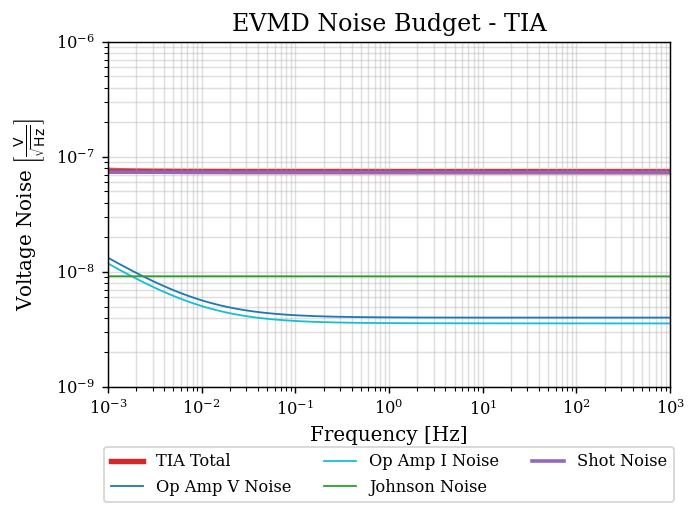

In [56]:
#### CALC TIA NOISE ####

# TIA stage, compute noise sources
analysis = zero.analysis.AcNoiseAnalysis(circuit=evmd)
solution = analysis.calculate(frequencies=f, input_type="current", node="pd11", sink="tia1_out", impedance='10M', incoherent_sum=True)
tia_darkn = solution.get_noise_sum(sink='tia1_out').spectral_density

# get noise contribtions from significant components (found using get_noisy_comps() function)
tia_vop = solution.get_noise(source='V(tia1)', sink='tia1_out').spectral_density
tia_iop = solution.get_noise(source='I(tia1, tia1_-)', sink='tia1_out').spectral_density
tia_rf = solution.get_noise(source='R(tia1_rf)', sink='tia1_out').spectral_density

# calculate shot noise based on DC level of sum channel
tia_shot = np.sqrt(2*1.6e-19* dc_pcurrent/2) * tia_tf.magnitude  #assuming beam centered on PD
tia_lightn = np.sqrt(tia_darkn**2 + tia_shot**2)
#tia_lightn = np.sqrt(tia_darkn**2)

print(get_noisy_comps(solution, thresh=1e-9))


fig, ax = plt.subplots(dpi=130)
plt.loglog(f, tia_lightn, label='TIA Total', color='tab:red', linewidth=3, zorder=1)

plt.loglog(f, tia_vop, label='Op Amp V Noise', color='tab:blue', linewidth=1)
plt.loglog(f, tia_iop, label='Op Amp I Noise', color='tab:cyan', linewidth=1)
plt.loglog(f, tia_rf, label='Johnson Noise', color='tab:green', linewidth=1)
plt.loglog(f, tia_shot, label='Shot Noise', color='tab:purple', linewidth=2)

plt.xlabel("Frequency [Hz]")
plt.ylabel(r"Voltage Noise $\left[ \frac{\mathrm{V}}{\sqrt{\mathrm{Hz}}} \right]$")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)
plt.grid(which='both')
plt.xlim([1e-3, 1e3])
plt.ylim(1e-9,1e-6)
plt.title("EVMD Noise Budget - TIA")

#ax.yaxis.set_major_formatter(ticker.EngFormatter())
#ax.xaxis.set_major_formatter(ticker.EngFormatter())

#plt.savefig('/Users/tom/Desktop/print.pdf', transparent=True, bbox_inches='tight')
plt.show()

<>:38: SyntaxWarning: invalid escape sequence '\l'
<>:38: SyntaxWarning: invalid escape sequence '\l'
/var/folders/fh/3pbmkshx1f76q4pncv9lrxrr0000gn/T/ipykernel_59313/3640240602.py:38: SyntaxWarning: invalid escape sequence '\l'
  '''


[[V(tia1) 1.328003057849805e-08 4.536098503386887e-09]
 [I(tia1, tia1_-) 1.1840350146237487e-08 3.938452375929518e-09]
 [R(tia1_rf) 9.163768702188373e-09 8.560972308560733e-09]
 [V(tia2) 1.3273264674345325e-08 4.533883931073294e-09]
 [I(tia2, tia2_-) 1.1840350146297871e-08 3.938452661035822e-09]
 [R(tia2_rf) 9.16376870223511e-09 8.560973040386894e-09]
 [R(diff_rin1) 9.073483155705752e-09 8.691779914797153e-09]
 [R(diff_rin2) 9.073483155705753e-09 8.691779914797146e-09]
 [V(diff) 2.6532997792183232e-08 9.121070642512551e-09]
 [I(diff, diff_+) 1.1608186534080167e-08 3.9442213002494345e-09]
 [I(diff, diff_-) 1.1608186534080163e-08 3.944221300249435e-09]
 [R(diff_rf1) 9.073483155705752e-09 8.691779914797153e-09]
 [R(diff_rf2) 9.073483155705755e-09 8.691779914797148e-09]]


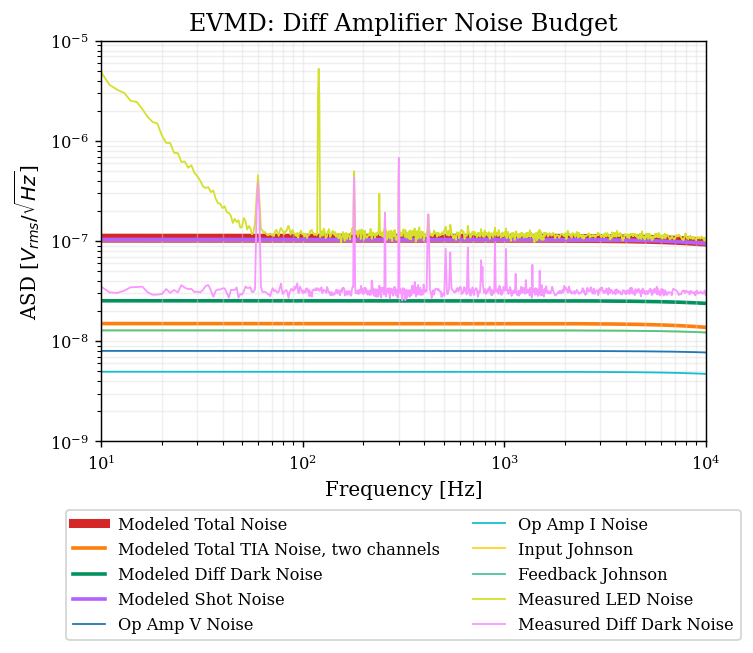

In [60]:
#### CALC DIFF NOISE ####

# Diff stage, compute noise sources
analysis = zero.analysis.AcNoiseAnalysis(circuit=evmd)
solution = analysis.calculate(frequencies=f, input_type="current", node="pd11", sink="diff_out", impedance='10M', incoherent_sum=True)
diff_darkn = solution.get_noise_sum(sink='diff_out').spectral_density

# get noise contribtions from significant components (found using get_noisy_comps() function)
tia_vop = solution.get_noise(source='V(tia1)', sink='diff_out').spectral_density
tia_iop = solution.get_noise(source='I(tia1, tia1_-)', sink='diff_out').spectral_density
tia_rf = solution.get_noise(source='R(tia1_rf)', sink='diff_out').spectral_density
tia_n = np.sqrt(tia_vop**2 + tia_iop**2 + tia_rf**2) * np.sqrt(2) #as two TIAs

diff_rin = solution.get_noise(source='R(diff_rin1)', sink='diff_out').spectral_density * np.sqrt(2) # as two RIs
diff_vop = solution.get_noise(source='V(diff)', sink='diff_out').spectral_density
diff_iop = solution.get_noise(source='I(diff, diff_-)', sink='diff_out').spectral_density * np.sqrt(2) # as two non grounded op amp inputs
diff_rf = solution.get_noise(source='R(diff_rf1)', sink='diff_out').spectral_density * np.sqrt(2) # as two RFs

# calculate shot noise based on DC level of sum channel
#diff_shot = np.sqrt(2*1.6e-19* dc_pcurrent) * diff_tf.magnitude #assuming beam centered on PD
diff_shot = np.sqrt(2 * 1.6e-19 * dc_pcurrent) * diff_tf.magnitude 
diff_lightn = np.sqrt(diff_darkn**2 + diff_shot**2)
#diff_lightn = np.sqrt(diff_darkn**2)

print(get_noisy_comps(solution, thresh=1e-9))

fig, ax = plt.subplots(dpi=130)
plt.loglog(f, diff_lightn, label='Modeled Total Noise', color='tab:red', linewidth=5, zorder=1)
plt.loglog(f, tia_n, label='Modeled Total TIA Noise, two channels', color='tab:orange', linewidth=2, zorder=1)
plt.loglog(f, diff_darkn, label='Modeled Diff Dark Noise', color="#03925e", linewidth=2, zorder=1)
plt.loglog(f, diff_shot, label='Modeled Shot Noise', color="#b261ff", linewidth=2)

plt.loglog(f, diff_vop, label='Op Amp V Noise', color='tab:blue', linewidth=1)
plt.loglog(f, diff_iop, label='Op Amp I Noise', color='tab:cyan', linewidth=1)
plt.loglog(f, diff_rin, label='Input Johnson', color="#ffd323", linewidth=1)
plt.loglog(f, diff_rf, label='Feedback Johnson', color="#4bc695", linewidth=1)

'''
plt.xlabel("Frequency [Hz]")
plt.ylabel(r"Voltage Noise $\left[ \frac{\mathrm{V}}{\sqrt{\mathrm{Hz}}} \right]$")
plt.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=3)
plt.grid(which='both')
plt.xlim([1e-3, 1e3])
plt.ylim(1e-9,1e-6)
plt.title(f"Diff EVMD Sat Amp Noise Budget ({dc_pcurrent/1e-3:.1f}mA Photocurrent)")
'''


import matplotlib.pyplot as plt

# Load your measured data
data = np.loadtxt("/Users/juliarice/Projects/remote_data/code/march16/mar16_xdiffled_100_16_03_2026_195213ptxt_stitched_spectra.txt") #x diff spd 1
data2 = np.loadtxt("/Users/juliarice/Projects/remote_data/code/march5/mar5_diffx_diffy_lednoise_100_05_03_2026_155548ptxt_stitched_spectra_chan2.txt") #ydiff spd 2
data3 = np.loadtxt("/Users/juliarice/Projects/remote_data/code/march16/mar16_xdiffdn_100_16_03_2026_191952ptxt_stitched_spectra.txt") #xdiff spd 2
data4 = np.loadtxt("/Users/juliarice/Projects/remote_data/code/march6&10/mar6_switchedspds_100_06_03_2026_140203ptxt_stitched_spectra_chan2.txt") #y diff spd 1
meas_freq = data[:, 0]
meas_noise = data[:, 1]
meas_freq2 = data2[:, 0]
meas_noise2 = data2[:, 1]
noise3 = data3[:,1]
freq3 = data3[:,0]
noise4 = data4[:,1]
freq4 = data4[:,0]


olddark = np.loadtxt("/Users/juliarice/Projects/remote_data/code/nov12_foil_on_spd_ch1dn_stitched_spectra.txt")
oldled = np.loadtxt('/Users/juliarice/Projects/remote_data/code/led_powered_with_pwr_supply_stitched_spectra.txt')

old_dfreq=olddark[:,0]
old_ddata=olddark[:,1]
old_ledfreq=oldled[:,0]
old_leddata=oldled[:,1]


# Try to overlay on the current figure
fig = plt.gcf()
ax = plt.gca()

fig.set_figwidth(6)                                                                    # Setting size of figure
fig.set_figheight(4)

ax.loglog(meas_freq, meas_noise, label="Measured LED Noise", color="#d4e02c", linewidth=1)
#ax.loglog(meas_freq2, meas_noise2, label="3/5/26 SPD 2 LED Noise, YDiff", color="#ff3d61", linewidth=0.7)
ax.loglog(freq3, noise3, label="Measured Diff Dark Noise", color="#f897ff", linewidth=1)
#ax.loglog(freq4, noise4, label="3/6/26 SPD1 LED Noise, YDiff", color="#81c7f3", linewidth=0.5)
#ax.loglog(old_dfreq, old_ddata, label="Dark Noise from October", color="darkviolet", linewidth=1)
#ax.loglog(old_ledfreq, old_leddata, label="LED Noise from October", color="fuchsia", linewidth=1)

plt.grid(True, which="both", ls="-", color='0.85')
plt.xlim(1e1, 1e4
        )   # Set x-axis from 0 to 5
plt.ylim(1e-9, 1e-5)
plt.title(f"EVMD: Diff Amplifier Noise Budget")
ax.set_xlabel('Frequency [Hz]')
ax.set_ylabel(r'ASD [$V_{rms}/\sqrt{Hz}$]')

ax.legend(loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)
#ax.legend()

plt.show()



#ax.yaxis.set_major_formatter(ticker.EngFormatter())
#ax.xaxis.set_major_formatter(ticker.EngFormatter())

#plt.savefig('./plots_v1/adl_osem_diffbudget.pdf', transparent=False, bbox_inches='tight')
plt.show()

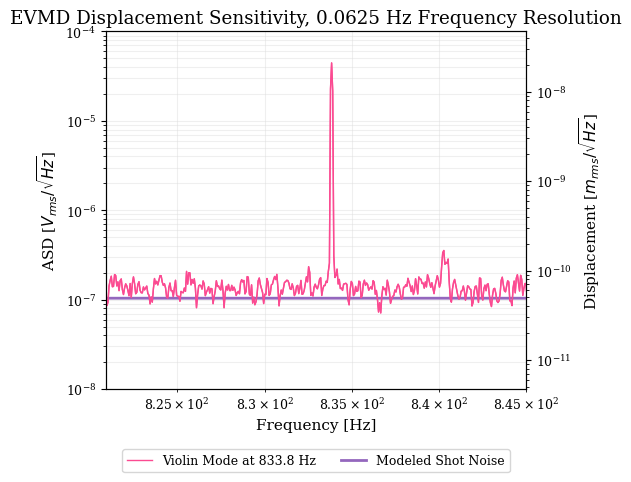

In [61]:
import numpy as np
import matplotlib.pyplot as plt

data = np.loadtxt("/Users/juliarice/Projects/remote_data/code/march12/mar12_834p8vm_zoomout11_12-03-2026_153735.txt")
freq = data[:, 0]
noise = data[:, 1]

V_per_m = 2120
fig, ax_volts = plt.subplots(figsize=(6, 5))
ax_disp = ax_volts.twinx()

ax_volts.loglog(freq, noise, color="#FB4A91", lw=1, label="Violin Mode at 833.8 Hz")
ax_volts.loglog(f, diff_shot, color='tab:purple', lw=2, label='Modeled Shot Noise')
ax_disp.loglog(freq, noise / V_per_m, color="#FB4A91", lw=1)

ax_volts.set_xlabel('Frequency [Hz]')
ax_volts.set_ylabel(r'ASD [$V_{rms}/\sqrt{Hz}$]')
ax_volts.set_xlim(821, 845)
ax_volts.set_ylim(1e-8, 1e-4)
ax_volts.grid(True, which="both", ls="-", color='0.85')

ax_disp.set_ylabel(r'Displacement [$m_{rms}/\sqrt{Hz}$]')
ax_disp.set_ylim(1e-8 / V_per_m, 1e-4 / V_per_m)

lines, labels = ax_volts.get_legend_handles_labels()
ax_volts.legend(lines, labels, loc='upper center', bbox_to_anchor=(0.5, -0.15), ncol=2)

plt.title("EVMD Displacement Sensitivity, 0.0625 Hz Frequency Resolution")
plt.tight_layout()
plt.show()

### <span style="color:rgb(253, 120, 255)"> Actuators

I've designed two actuators with different electrode patterns and am currently in the process of testing them. They look like this:


| d~0.5mm, L~1mm | d~1mm, L~6mm |
| :---: | :---: |
| ![Screenshot 2026-04-12 at 7.28.17 PM.png](<attachment:Screenshot 2026-04-12 at 7.28.17 PM.png>) | ![Screenshot 2026-04-12 at 7.28.11 PM.png](<attachment:Screenshot 2026-04-12 at 7.28.11 PM.png>) |

According to my simulations, the blobby actuator on the right should be capable of producing the necessary ~$10^{-10}$ N needed to damp a mode at $10^{-15}$ in roughly 60 seconds. 

In the past we've used actuators with electrodes much closer together, so I made the design on the right to test as well. 

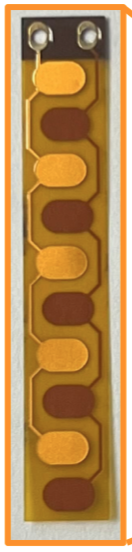
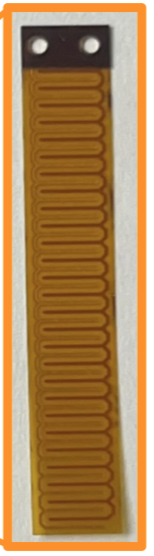

## <span style="color:rgb(253, 120, 255)"> Bibliography

[1] Vibration Isolation, Caltech/MIT/Ligo Lab, https://www.ligo.caltech.edu/page/vibration-isolation

[2] G Eddolls 2022 PhD Thesis, University of Glasgow

[3] LHO alog 71404

[4] Thermal noise in mechanical experiments, Peter Saulson, https://journals.aps.org/prd/pdf/10.1103/PhysRevD.42.2437

[5] Large-scale Monolithic Fused-Silica Mirror Suspension for Third-Generation
Gravitational-Wave Detectors, Alan Cumming et al. https://journals.aps.org/prapplied/pdf/10.1103/PhysRevApplied.17.024044

[6] On Non-Gaussian Beams and Optomechanical Parametric Instabilities in Interferometric Gravitational Wave Detectors, John Miller https://gwic.science/assets/docs/theses/miller_thesis.pdf

[7] Electrostatic Drive - Periodic Plane Solution, Stefan Ballmer https://gitlab.com/syracuse_experimental_gravity/evmd/-/blob/main/references/Electrostatic_Drive___Periodic_Plane_Solution.pdf?ref_type=heads 





